# import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
# make plot output appear and save in the notebook
%matplotlib inline

from pandas.plotting import scatter_matrix

# EDA

## read_dataset

In [2]:
df_train = pd.read_csv('./data/df_train_prepared.csv')
df_train.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,std15,std16,std17,std18,std19,std20,std21,ttf,bnc_label,mcc_lable
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,191,0,0
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,0.008697,0.0,0.000000,0.0,0.0,0.042426,0.003253,190,0,0
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,0.007640,0.0,1.154701,0.0,0.0,0.055076,0.044573,189,0,0
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,0.028117,0.0,1.000000,0.0,0.0,0.076322,0.037977,188,0,0
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,0.025953,0.0,1.095445,0.0,0.0,0.073621,0.033498,187,0,0


In [3]:
features = ['setting1', 'setting2', 'setting3','s1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14', 's15', 's16', 's17', 's18', 's19', 's20', 's21']

<AxesSubplot:title={'center':'Standard Deviation of the Features'}>

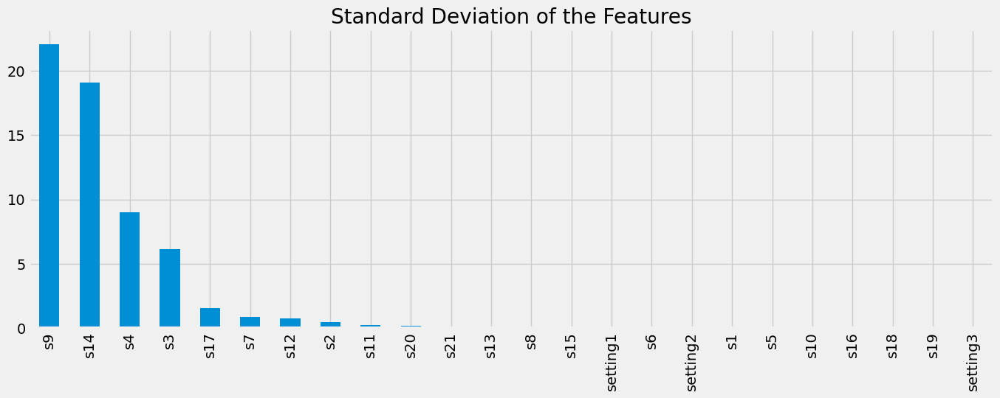

In [ ]:
# get the std distribution of the features
df_train[features].describe().loc['std'].sort_values(ascending=False).plot(kind='bar', figsize=(15, 5), title='Standard Deviation of the Features')

<AxesSubplot:title={'center':'Log of Standard Deviation of the Features'}>

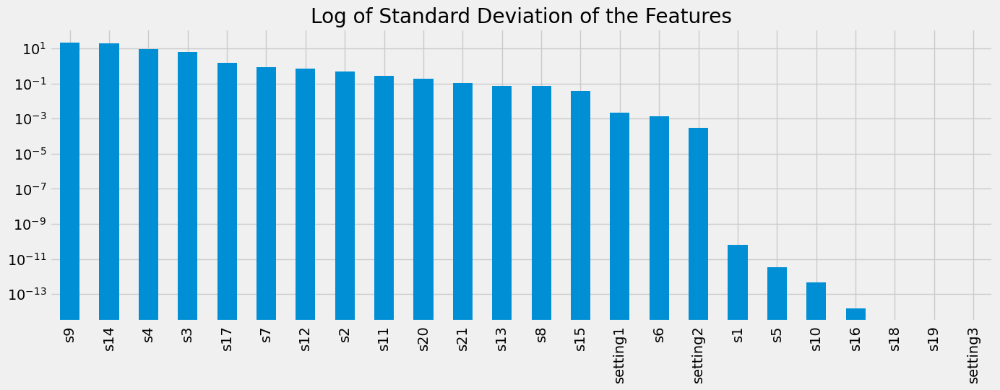

In [ ]:
# get the log of std distribution of the features
df_train[features].describe().loc['std'].sort_values(ascending=False).plot(kind='bar', logy=True,figsize=(15, 5), title='Log of Standard Deviation of the Features')

In [ ]:
# get ordered list features correlation with regression label ttf

df_train[features].corrwith(df_train.ttf).sort_values(ascending=False)

s12         6.719831e-01
s7          6.572227e-01
s21         6.356620e-01
s20         6.294285e-01
s16         1.315234e-16
s5          1.315234e-16
setting2   -1.947628e-03
setting1   -3.198458e-03
s6         -1.283484e-01
s14        -3.067689e-01
s9         -3.901016e-01
s13        -5.625688e-01
s8         -5.639684e-01
s3         -5.845204e-01
s17        -6.061536e-01
s2         -6.064840e-01
s15        -6.426670e-01
s4         -6.789482e-01
s11        -6.962281e-01
setting3             NaN
s1                   NaN
s10                  NaN
s18                  NaN
s19                  NaN
dtype: float64

<AxesSubplot:title={'center':'Correlation with ttf'}>

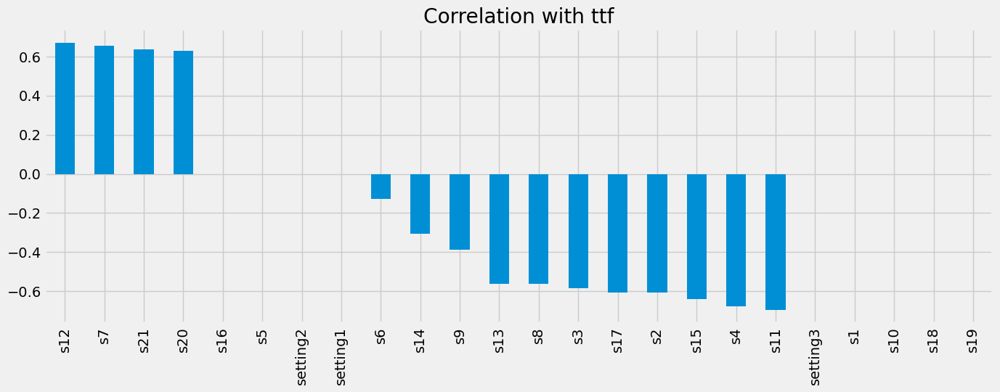

In [11]:
df_train[features].corrwith(df_train['ttf']).sort_values(ascending=False).plot(kind='bar', figsize=(15, 5), title='Correlation with ttf')

In [4]:
low_corr_features = ['setting1', 'setting2', 'setting3', 's16', 's5', 's1', 's10', 's18', 's19']
df_train[low_corr_features].describe()

,setting1,setting2,setting3,s16,s5,s1,s10,s18,s19
count,20631.000000,20631.000000,20631.0,2.063100e+04,2.063100e+04,2.063100e+04,2.063100e+04,20631.0,20631.0
mean,-0.000009,0.000002,100.0,3.000000e-02,1.462000e+01,5.186700e+02,1.300000e+00,2388.0,100.0
std,0.002187,0.000293,0.0,1.556432e-14,3.394700e-12,6.537152e-11,4.660829e-13,0.0,0.0
min,-0.008700,-0.000600,100.0,3.000000e-02,1.462000e+01,5.186700e+02,1.300000e+00,2388.0,100.0
25%,-0.001500,-0.000200,100.0,3.000000e-02,1.462000e+01,5.186700e+02,1.300000e+00,2388.0,100.0
50%,0.000000,0.000000,100.0,3.000000e-02,1.462000e+01,5.186700e+02,1.300000e+00,2388.0,100.0
75%,0.001500,0.000300,100.0,3.000000e-02,1.462000e+01,5.186700e+02,1.300000e+00,2388.0,100.0
max,0.008700,0.000600,100.0,3.000000e-02,1.462000e+01,5.186700e+02,1.300000e+00,2388.0,100.0


In [5]:
# c = [col for col in df_train[features] if col not in low_corr_features]

high_corr_features = ['s2','s3','s4','s6','s7','s8','s9','s11','s12','s13','s14','s15','s17','s20','s21']
df_train[high_corr_features].describe()

,s2,s3,s4,s6,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000
mean,642.680934,1590.523119,1408.933782,21.609803,553.367711,2388.096652,9065.242941,47.541168,521.413470,2388.096152,8143.752722,8.442146,393.210654,38.816271,23.289705
std,0.500053,6.131150,9.000605,0.001389,0.885092,0.070985,22.082880,0.267087,0.737553,0.071919,19.076176,0.037505,1.548763,0.180746,0.108251
min,641.210000,1571.040000,1382.250000,21.600000,549.850000,2387.900000,9021.730000,46.850000,518.690000,2387.880000,8099.940000,8.324900,388.000000,38.140000,22.894200
25%,642.325000,1586.260000,1402.360000,21.610000,552.810000,2388.050000,9053.100000,47.350000,520.960000,2388.040000,8133.245000,8.414900,392.000000,38.700000,23.221800
50%,642.640000,1590.100000,1408.040000,21.610000,553.440000,2388.090000,9060.660000,47.510000,521.480000,2388.090000,8140.540000,8.438900,393.000000,38.830000,23.297900
75%,643.000000,1594.380000,1414.555000,21.610000,554.010000,2388.140000,9069.420000,47.700000,521.950000,2388.140000,8148.310000,8.465600,394.000000,38.950000,23.366800
max,644.530000,1616.910000,1441.490000,21.610000,556.060000,2388.560000,9244.590000,48.530000,523.380000,2388.560000,8293.720000,8.584800,400.000000,39.430000,23.618400


**Note: ['s2','s3','s4','s6','s7','s8','s9','s11','s12','s13','s14','s15','s17','s20','s21'] could be target for feature selection during modeling since their correlation with TTF is higher than other features.**  

Let us disply this correlation in heatmap

In [6]:
# add target variable ttf to high_corr_features
high_corr_features.append('ttf')
high_corr_features

['s2',
 's3',
 's4',
 's6',
 's7',
 's8',
 's9',
 's11',
 's12',
 's13',
 's14',
 's15',
 's17',
 's20',
 's21',
 'ttf']

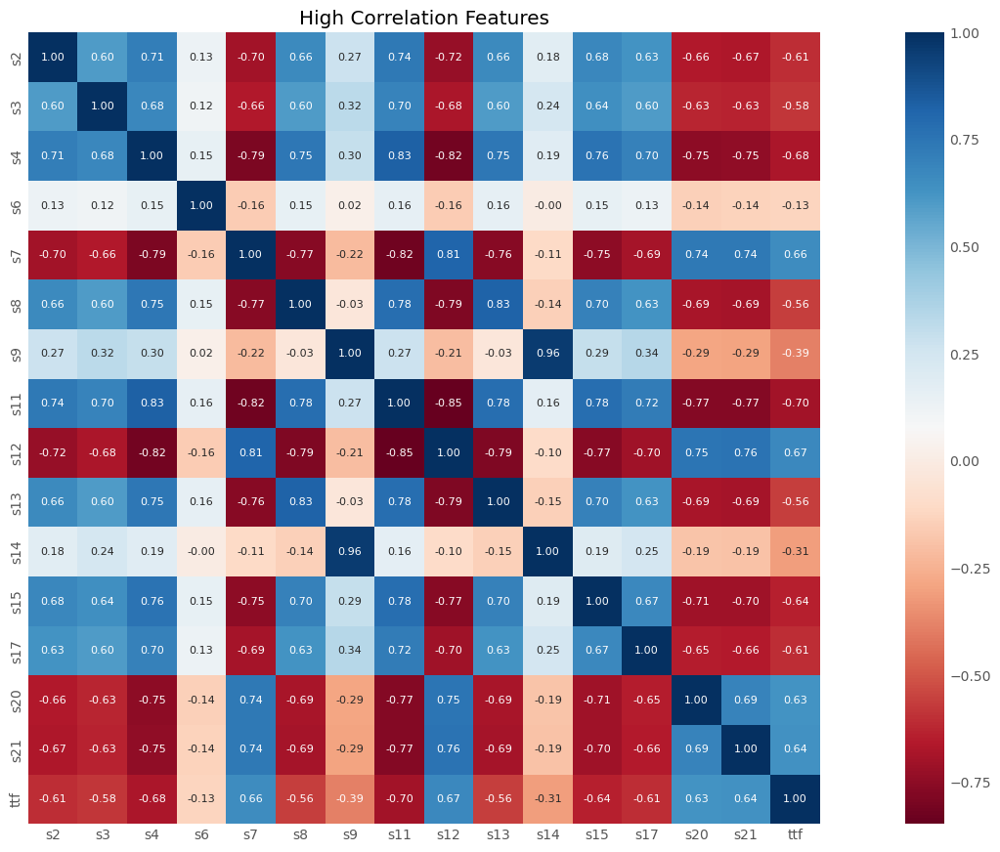

In [42]:
# heatmap of the correlation matrix
plt.figure(figsize=(20,10))
sns.heatmap(df_train[high_corr_features].corr(), annot=True, square=True, fmt=".2f", annot_kws={"size":8},cmap="RdBu")
plt.title('High Correlation Features')
plt.show()

There is a very high correlation (> 0.8) between some features: (s14, s9) most corr one, (s11, s4), (s11, s7), (s11, s12) second most corr, (s4, s12), (s8,s13),  (s7, s12)  
This may hurt the performance of some ML algorithms.  

So, some of the above features will be target for removal in feature selection

c:\Users\M4TECH\anaconda3\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


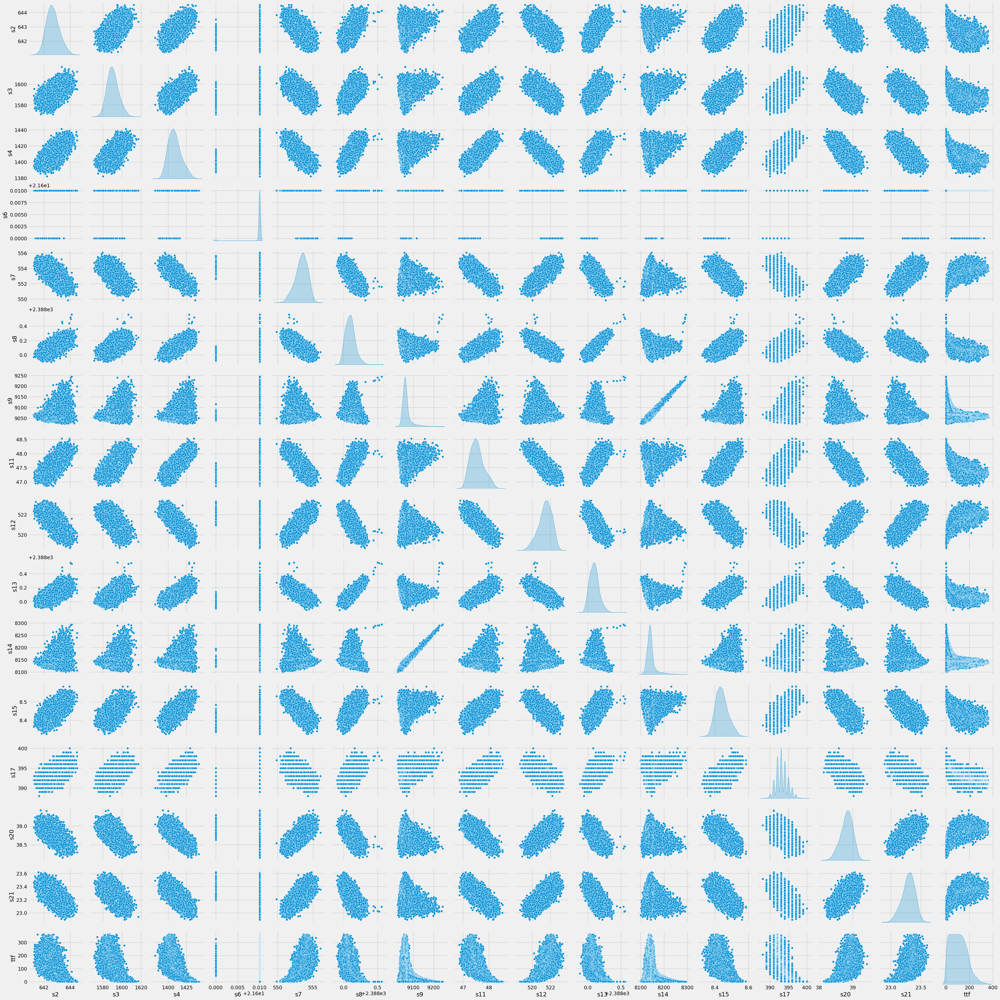

In [35]:
sns.pairplot(df_train[high_corr_features], size=2.5, diag_kind='kde')
plt.show()

array([[<AxesSubplot:xlabel='s2', ylabel='s2'>,
        <AxesSubplot:xlabel='s3', ylabel='s2'>,
        <AxesSubplot:xlabel='s4', ylabel='s2'>,
        <AxesSubplot:xlabel='s6', ylabel='s2'>,
        <AxesSubplot:xlabel='s7', ylabel='s2'>,
        <AxesSubplot:xlabel='s8', ylabel='s2'>,
        <AxesSubplot:xlabel='s9', ylabel='s2'>,
        <AxesSubplot:xlabel='s11', ylabel='s2'>,
        <AxesSubplot:xlabel='s12', ylabel='s2'>,
        <AxesSubplot:xlabel='s13', ylabel='s2'>,
        <AxesSubplot:xlabel='s14', ylabel='s2'>,
        <AxesSubplot:xlabel='s15', ylabel='s2'>,
        <AxesSubplot:xlabel='s17', ylabel='s2'>,
        <AxesSubplot:xlabel='s20', ylabel='s2'>,
        <AxesSubplot:xlabel='s21', ylabel='s2'>,
        <AxesSubplot:xlabel='ttf', ylabel='s2'>],
       [<AxesSubplot:xlabel='s2', ylabel='s3'>,
        <AxesSubplot:xlabel='s3', ylabel='s3'>,
        <AxesSubplot:xlabel='s4', ylabel='s3'>,
        <AxesSubplot:xlabel='s6', ylabel='s3'>,
        <AxesSubplot:xlabel='s

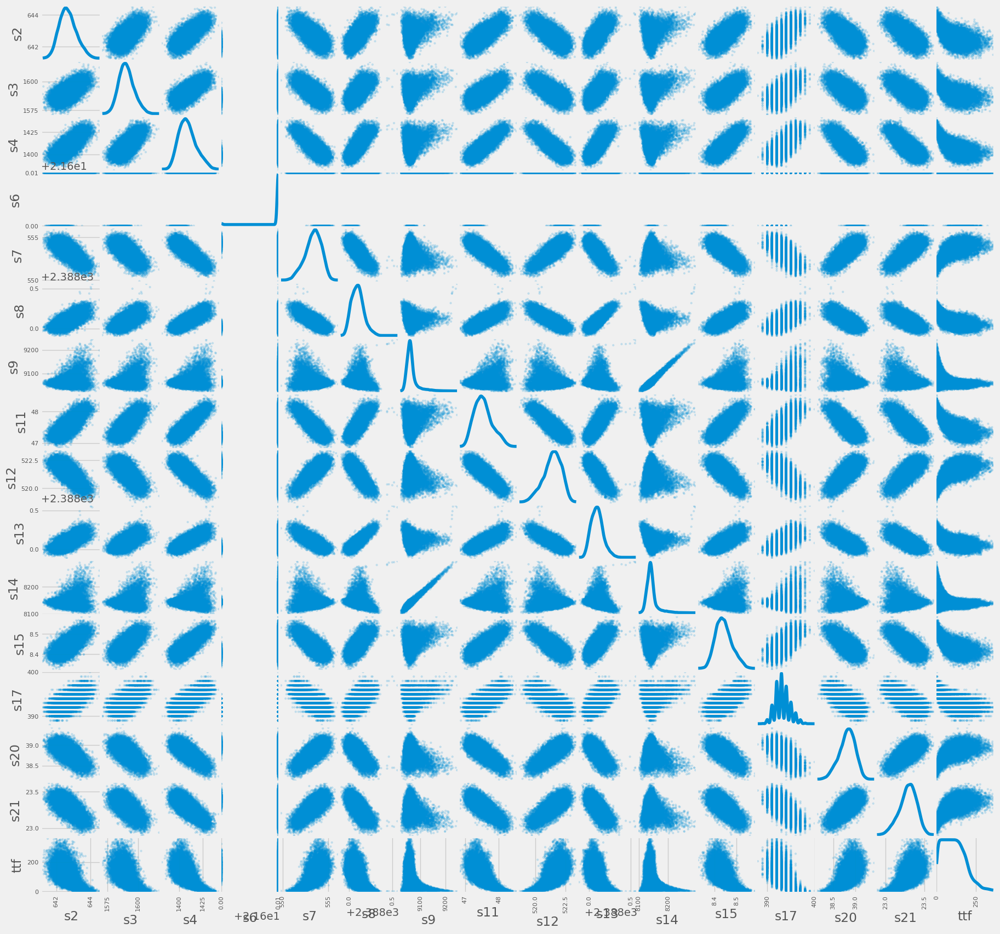

In [45]:
# plot scatter_matrix of the high correlation features
scatter_matrix(df_train[high_corr_features], figsize=(20, 20), diagonal='kde', alpha=0.2)

Most of the features have normal distribution which has positve effect on machine learning algorithms.  

Most of the features have non-linear relationship with the regression label ttf, so using polynomial models may lead to better results.

Let us create a helper function to ease exploration of each feature invidually

# Feature plot for high correlation features

In [62]:
def feature_plot(df ,sensor, engine):
    """
    args:
        sensor: sensor number
        engine: engine number
    
    return:
        histgram plot
        box plot
        time series plot
        scatter plot    
    """
    
    plt.style.use('fivethirtyeight')
    fig , ax = plt.subplots(2,2,figsize=(15, 12))    
    
    # histogram
    sub1 = ax[0, 0]
    sub1.set_title(f"{sensor} histogram")
    sub1.hist(df[sensor])
    ax[0, 0].set_xlabel(sensor)
    ax[0, 0].set_ylabel('count')
    
    # box plot
    sub2 = ax[0, 1]
    sub2.set_title(f"{sensor} box plot")
    sub2.boxplot(df[sensor])
    ax[0, 1].set_ylabel(sensor)
    
    
    # time series plot
    #np.random.seed(12345)

    if engine > 100 or engine <= 0:
        select_engine = list(pd.unique(df.id))
    else:
        select_engine = np.random.choice(list(pd.unique(df.id)), engine, replace=False)
    
    sub3 = ax[1, 0]
    sub3.set_title(f"{sensor} time series plot")
    ax[1, 0].set_xlabel('cycle')
    ax[1, 0].set_ylabel(sensor)
    
    names = [f'Engine {i}' for i in select_engine]

    for i in select_engine:
        data = df[['cycle', sensor]][df.id == i]
        sub3.plot(data['cycle'], data[sensor])
        ax[1,0].legend(names, labelspacing=0.2, loc='upper right')

    # scatter plot
    sub4 = ax[1, 1]
    sub4.set_title(f"{sensor} scatter plot")
    sub4.scatter(df['ttf'], df[sensor])
    ax[1,1].set_xlabel('TTF')
    ax[1,1].set_ylabel(sensor)
    
    plt.tight_layout()
    plt.show()

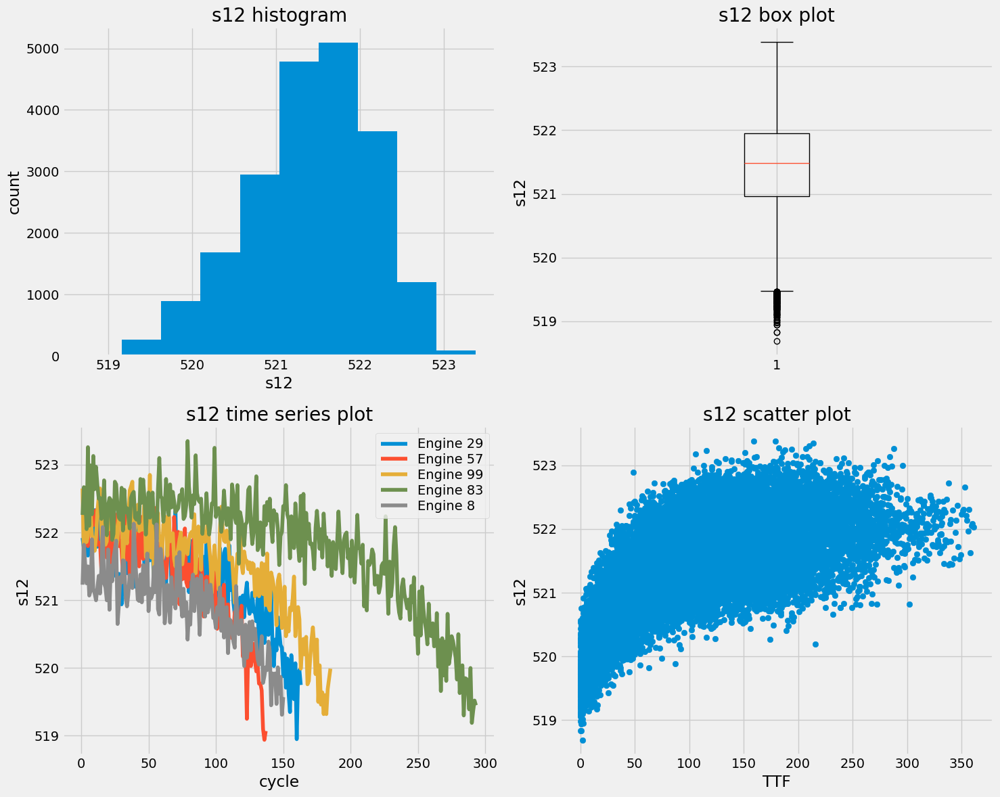

In [63]:
feature_plot(df_train, 's12', 5)

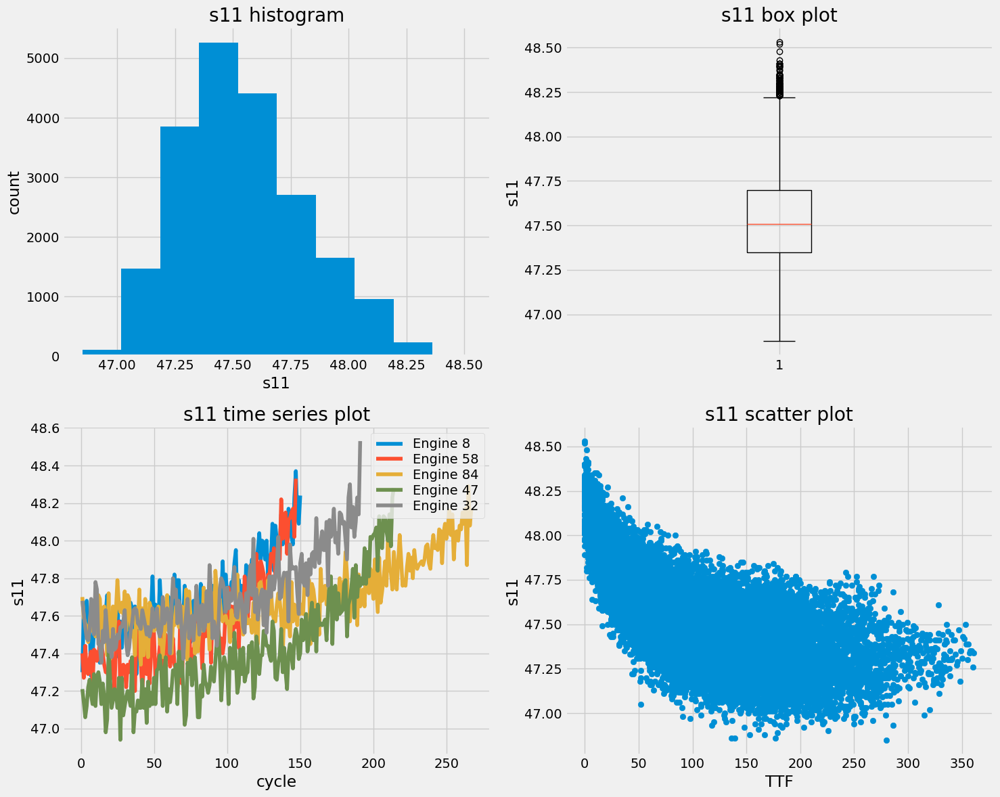

In [64]:
feature_plot(df_train, 's11', 5)

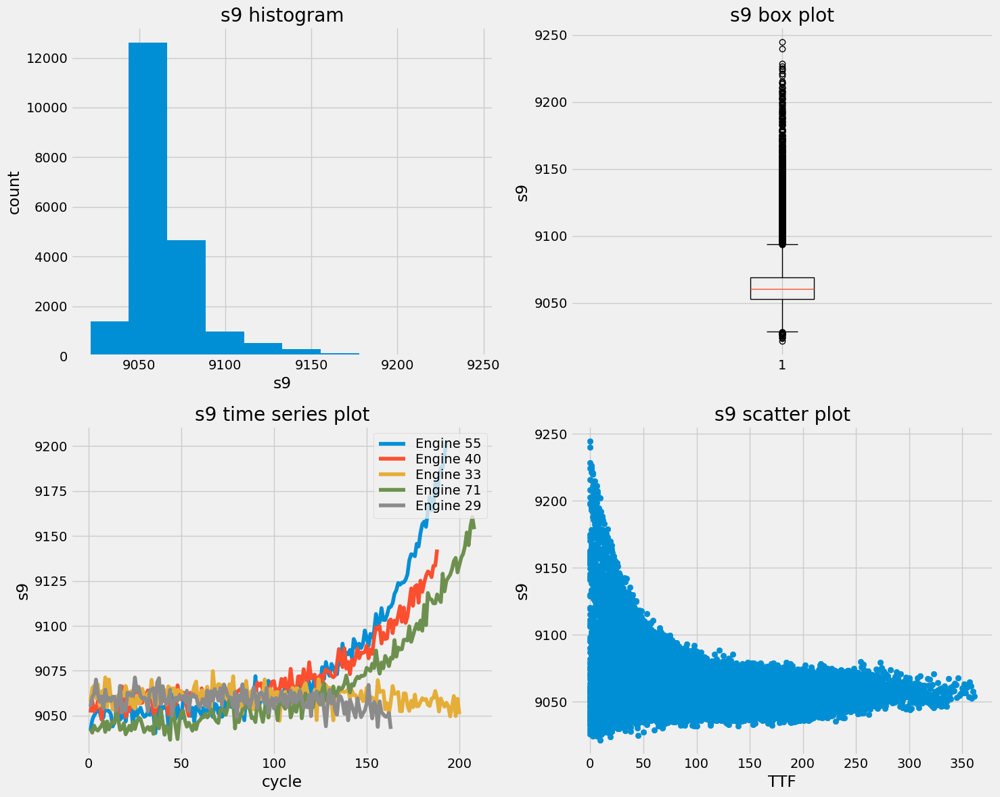

In [65]:
feature_plot(df_train, 's9', 5)

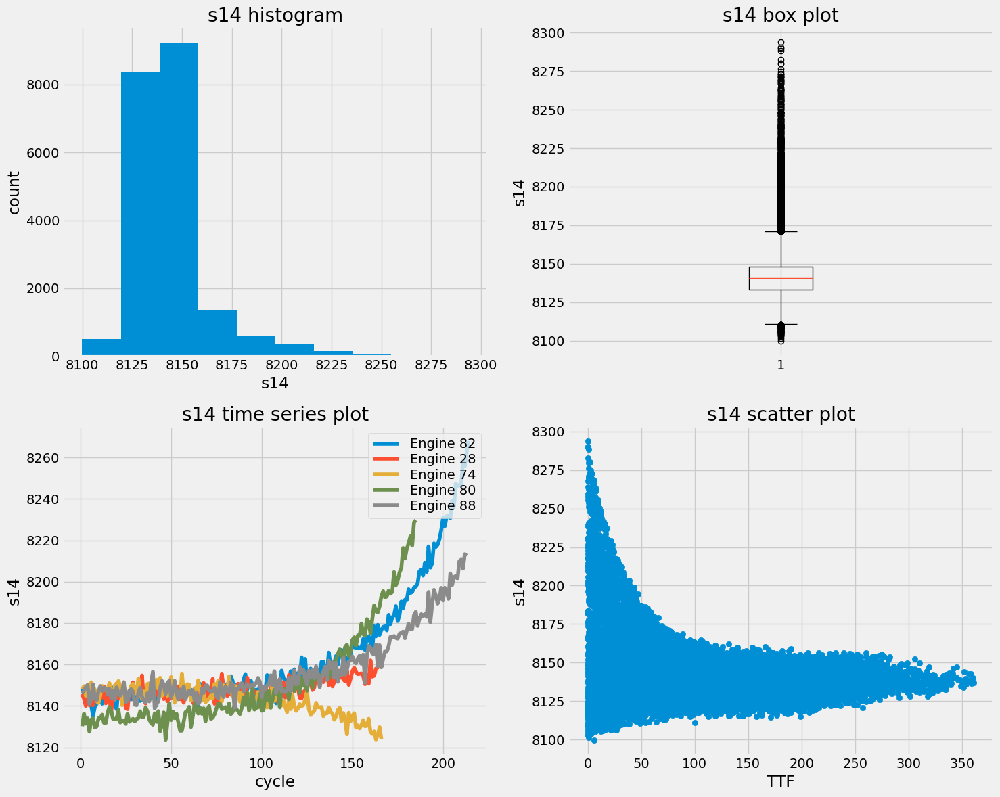

In [66]:
feature_plot(df_train, 's14', 5)

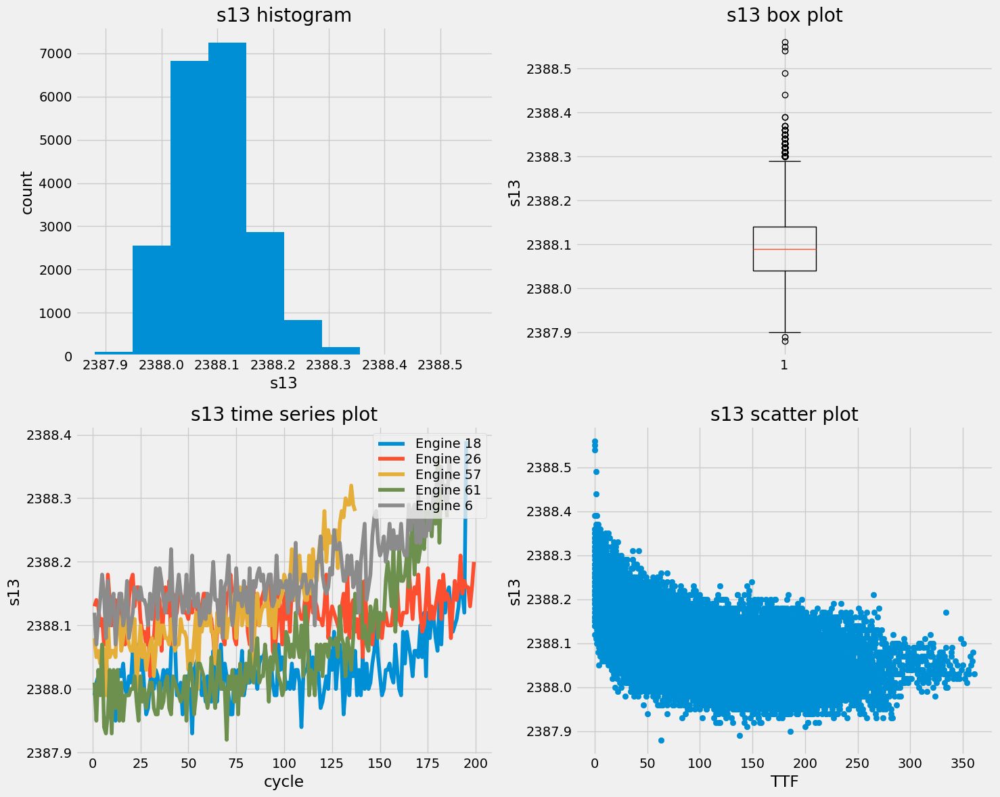

In [67]:
feature_plot(df_train, 's13', 5)

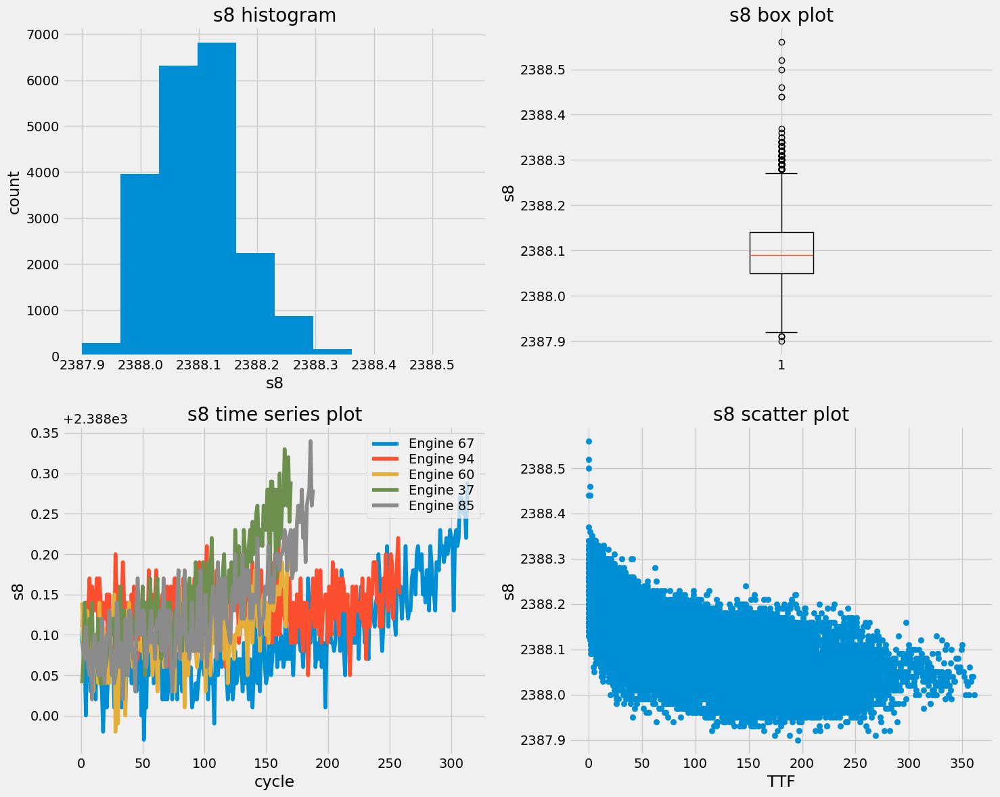

In [68]:
feature_plot(df_train, 's8', 5)

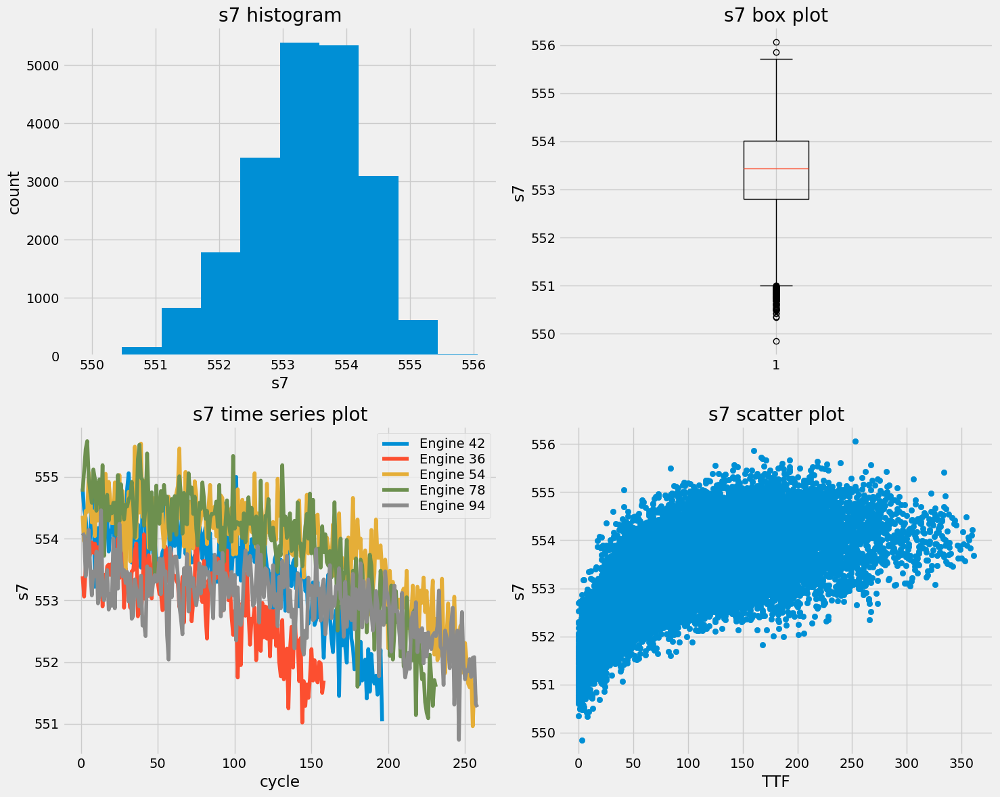

In [69]:
feature_plot(df_train, 's7', 5)

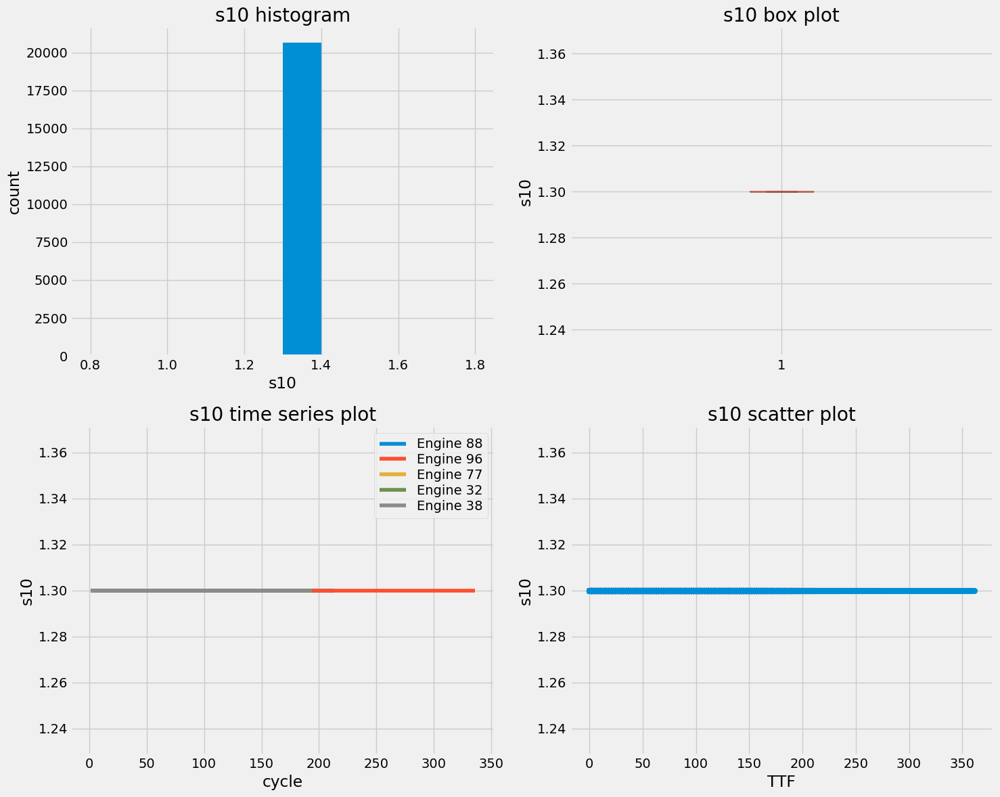

In [70]:
feature_plot(df_train, 's10', 5)

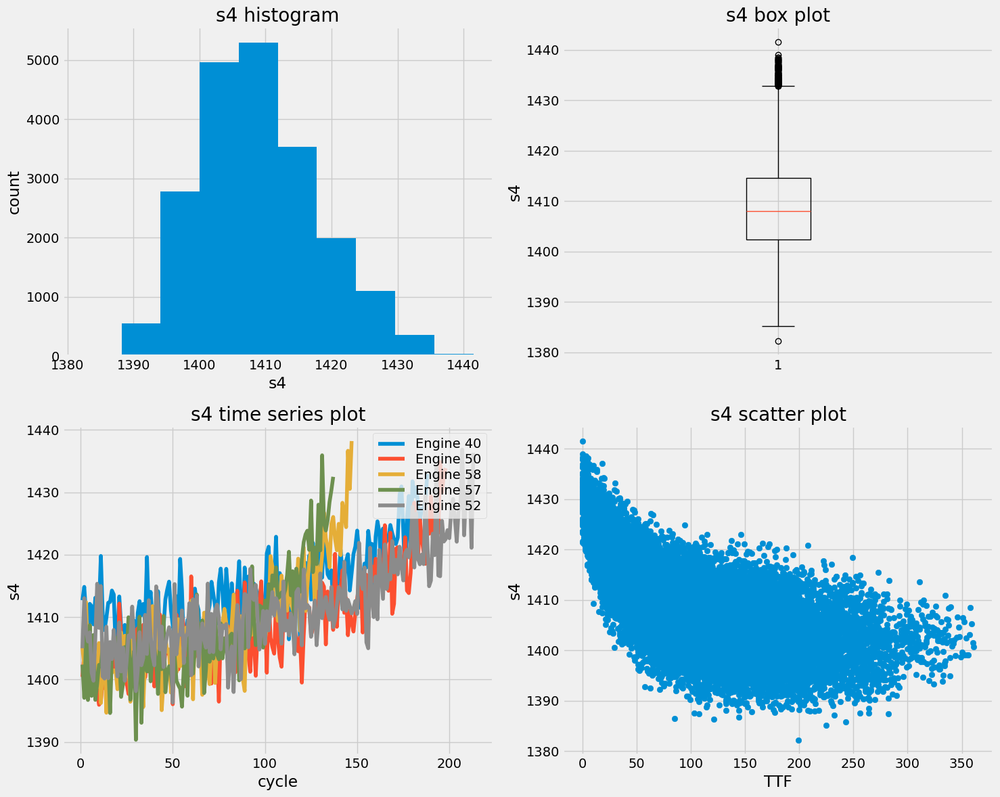

In [71]:
feature_plot(df_train, 's4', 5)

# Time series plot for high correlation sensor

In [100]:
# Create a function to explore the time series plot each sensor selecting random sample engines

def plot_time_series(s):
    
    """
    Plot time series of a single sensor for 10 random sample engines.
    
    Args:
        s (str): The column name of the sensor to be plotted.

    Returns:
        plots
        
    """

    plt.style.use('ggplot')
    fig, ax = plt.subplots(5,1,figsize=(12, 8), sharex=True, sharey=True)
    fig.suptitle(f"{s} time series/cycle plot", fontsize=16)
    
    select_engine = np.random.choice(list(pd.unique(df_train.id)), 5, replace=False).tolist()

    for i in select_engine:
        data = df_train[['cycle', s]][df_train.id == i]
        j = select_engine.index(i)
        ax[j].plot(data['cycle'], data[s], linestyle='-', linewidth=1.8, color = 'b')
        ax[j].set_xlabel('cycle')
        ax[j].set_ylabel('Engine' + ' ' + str(i))
    
    plt.tight_layout()
    plt.show()    

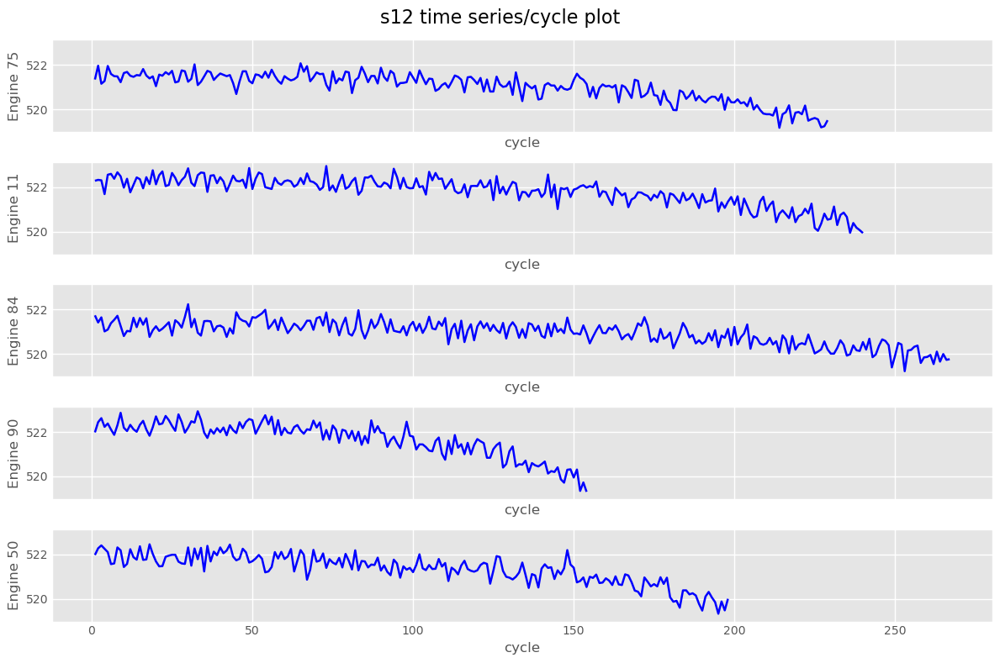

In [101]:
plot_time_series('s12')

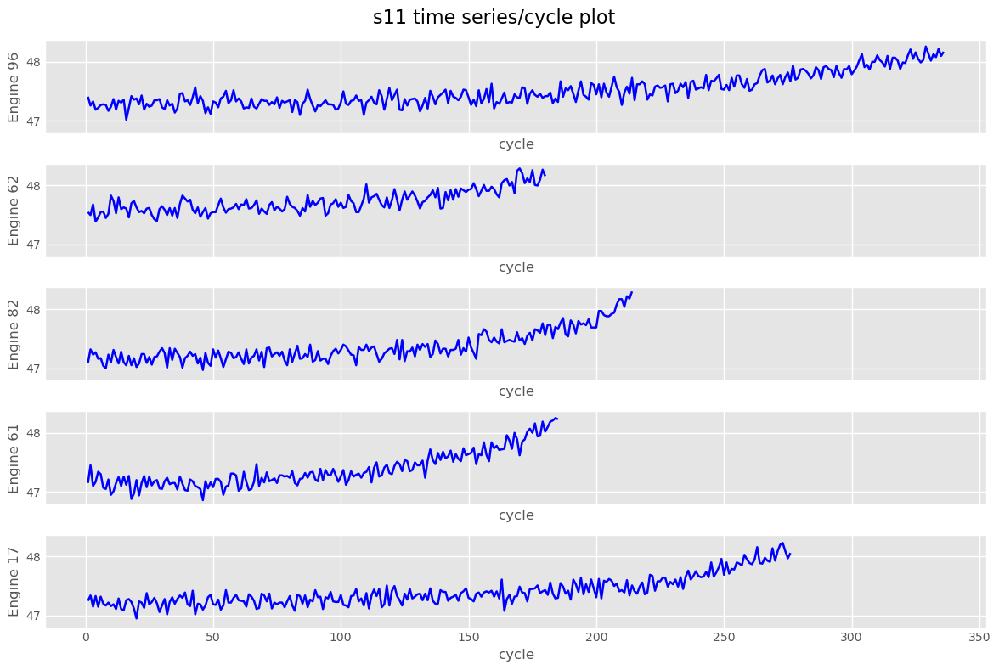

In [102]:
plot_time_series('s11')

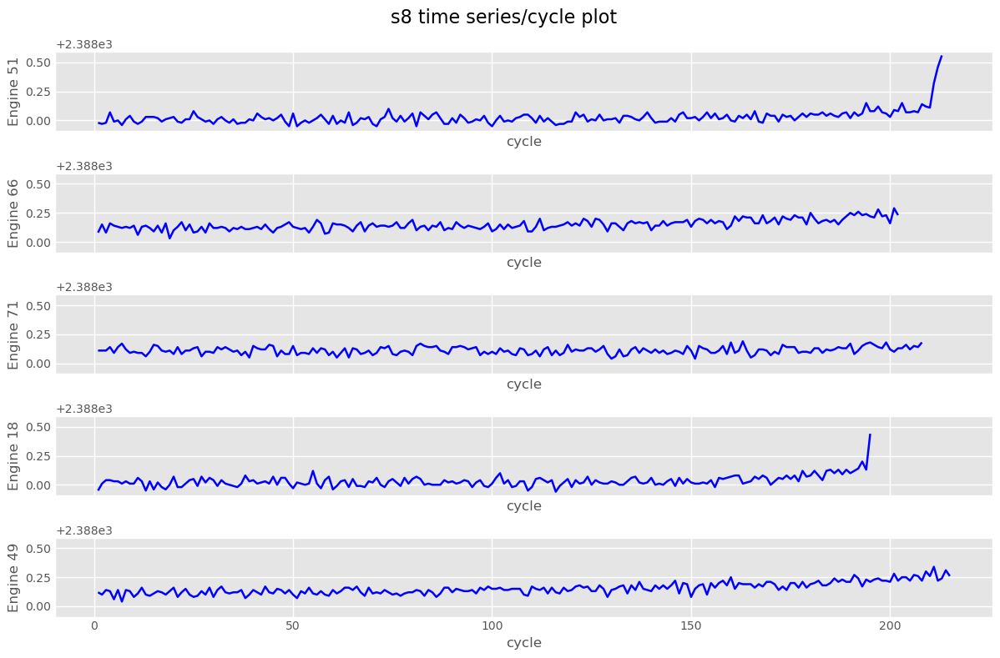

In [103]:
plot_time_series('s8')

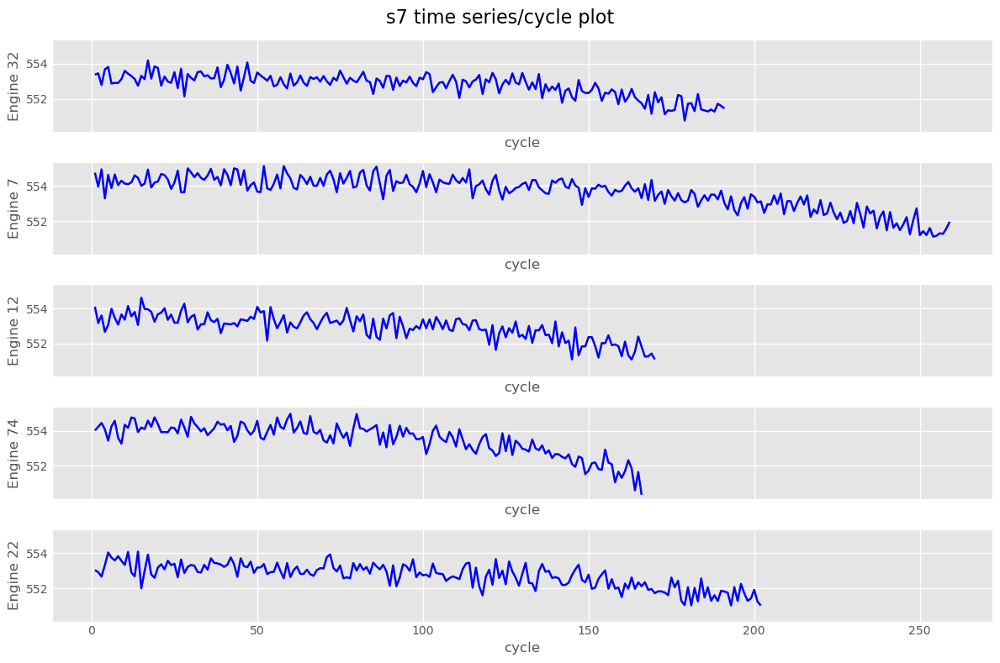

In [104]:
plot_time_series('s7')

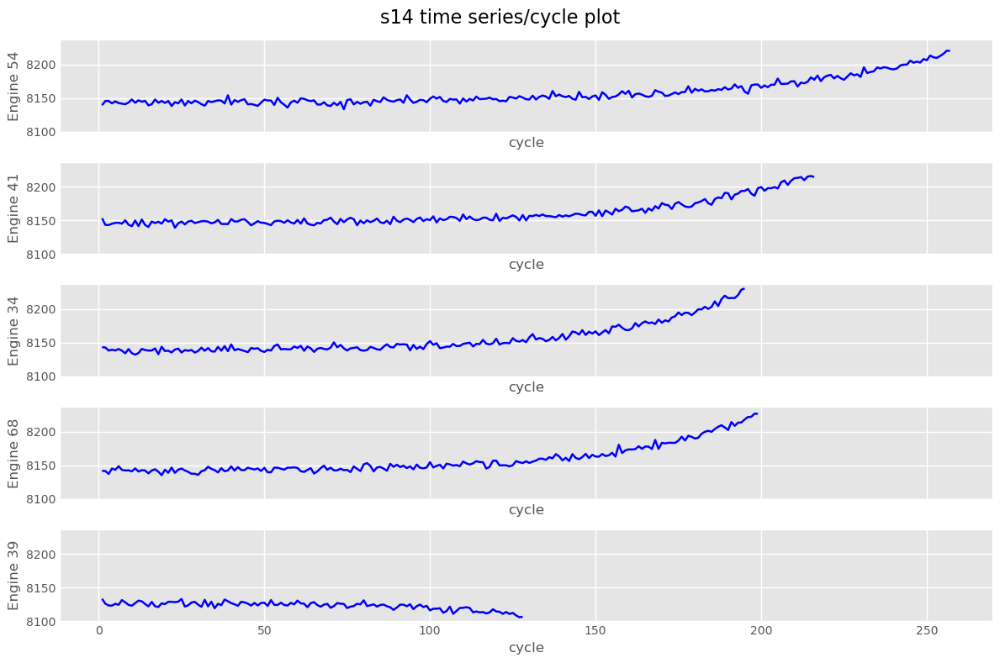

In [105]:
plot_time_series('s14')

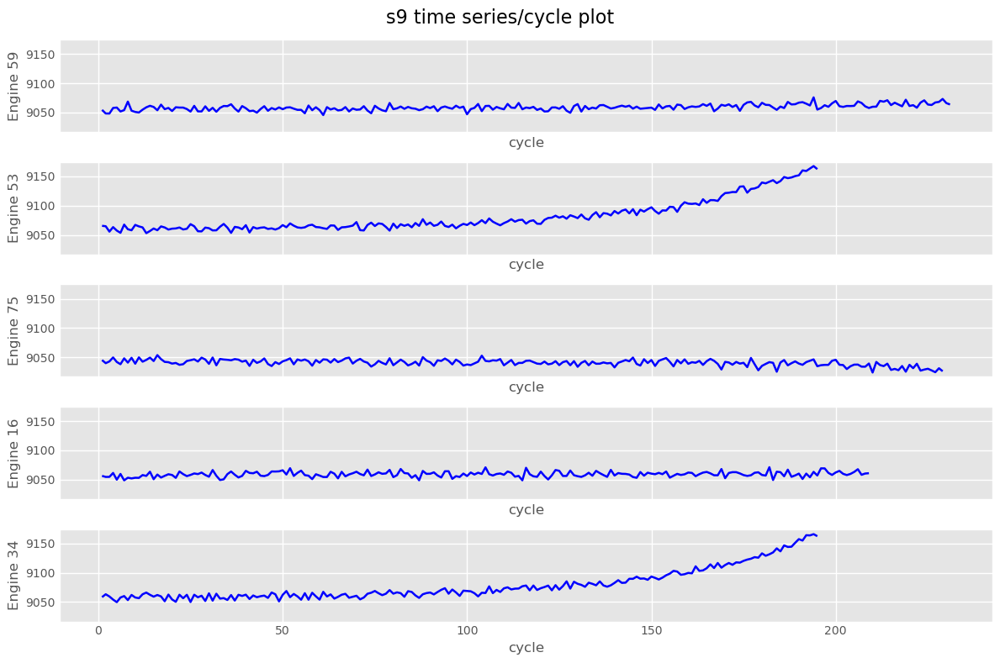

In [106]:
plot_time_series('s9')

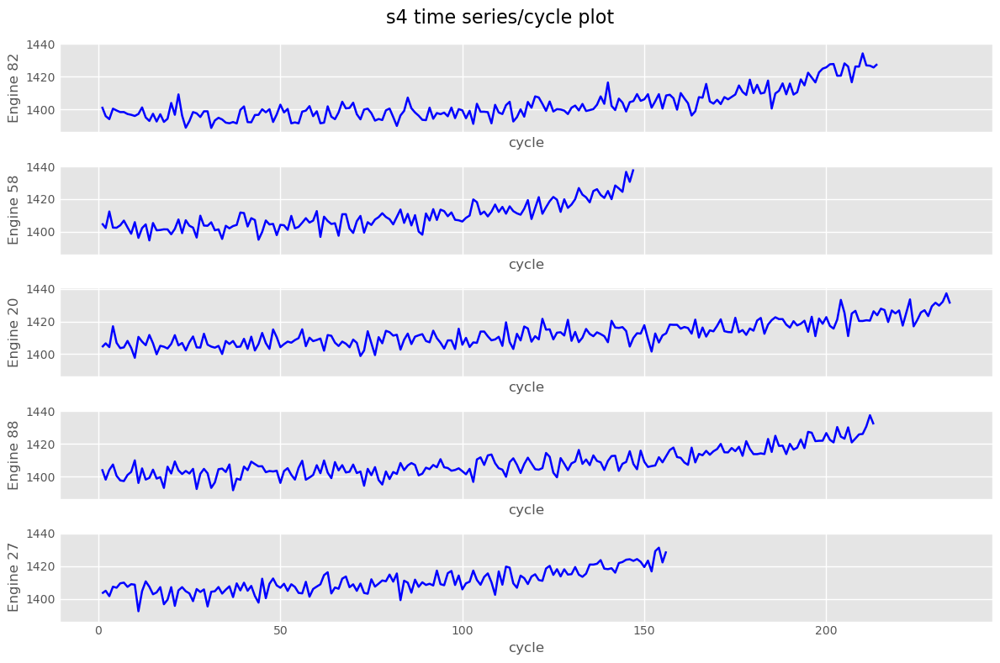

In [107]:
plot_time_series('s4')

# Check classification label distribution

In [114]:
# check binary classification label distribution
print(df_train['bnc_label'].value_counts())
print(f"\nNegative class: {round(df_train['bnc_label'].value_counts()[0] / len(df_train) * 100, 2)}%")
print(f"\nPositive class: {round(df_train['bnc_label'].value_counts()[1] / len(df_train) * 100, 2)}%")

0    17531
1     3100
Name: bnc_label, dtype: int64

Negative class: 84.97%

Positive class: 15.03%


In [119]:
# check multiclass classification label distribution
print(df_train['mcc_lable'].value_counts())
print(f"\nClass 0 - No Failure: {round(df_train['mcc_lable'].value_counts()[0] / len(df_train) * 100, 2)}%")
print(f"\nClass 1 - Failure: {round(df_train['mcc_lable'].value_counts()[1] / len(df_train) * 100, 2)}%")
print(f"\nClass 2 - Failure: {round(df_train['mcc_lable'].value_counts()[2] / len(df_train) * 100, 2)}%")

0    17531
2     1600
1     1500
Name: mcc_lable, dtype: int64

Class 0 - No Failure: 84.97%

Class 1 - Failure: 7.27%

Class 2 - Failure: 7.76%


Here we should use AUC ROC for classification evaluation.

# EDA Summary

-  There is a very high correlation (> 0.8) between some features e.g.(s14, s9), (s11, s4), (s11, s7), (s11, s12), (s4, s12), (s8,s13),  (s7, s12). This multicollinearity may hurt the performance of some machine learning algorithms. So, part of these features will be target for elimination in feature selection during the modeling phase.  
-  Most features have nonlinear relation with the TTF, hence adding their polynomial transforms may enhance models performance.
-  Most features exhibit normal distribution which is likely improves models performance. 
-  AUC ROC should be used for classification models evaluation instead of Accuracy due to class imbalance in the training data.
